In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import pandas_profiling
import scipy

# Rest Data 
--------
### Data Loading
The data is first transformed into suitable format using a converter code, <br/>to be in csv format and remove redunant columns

### Data Visualization

We Visualize the time series in time domain. to make a visual check that we are loading the correct data,
<br/> and we can use it to the next steps

### Data Statistical Reporting 

Here we generate a full report for each sample, 
<br/>to see the correlation between signals and also the see the Statistical features of the data itself


### Transformation of the dataset to frequency domain and generation of power specturm

We do this, because EEG is only useful in frequency, and it's not having useful features in time domain alone,
also to apply a HPF to choose the relevant features

### Building the final dataset for classifcation 

We combine the data from all the samples, and add relevant features, to build a small dataset for the model itself

In [2]:
import glob

rst_list = [f for f in glob.glob("OpenBCI_Converted/rest/*.csv")]
rst_list

['OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-10-05_15-07-34 rest.csv',
 'OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_03-28-21.csv',
 'OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-25-36.csv',
 'OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-38-49.csv',
 'OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_04-55-39.csv',
 'OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_04-37-15.csv']

In [3]:
rsts = []
for rst in rst_list :
    test_rest = pd.read_csv(rst)
    test_rest = test_rest.replace(np.nan, 0)
    rsts.append(test_rest)
    print("-------------"+rst+"-------------")
    print(test_rest.head(5))

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-10-05_15-07-34 rest.csv-------------
    Time    chan1     chan2     chan3     chan4     chan5     chan6     chan7  \
0  0.008     0.00      0.00      0.00      0.00      0.00      0.00      0.00   
1  0.016   -19.98    -17.26     -7.64    -15.33    -16.05    -12.85    -17.77   
2  0.024 -3673.38 -15750.22 -27159.60 -36899.76 -28896.94 -32708.13 -29909.09   
3  0.032 -5202.37 -15375.00 -26981.97 -36906.73 -29312.35 -32940.99 -29760.43   
4  0.040 -4410.80 -14893.08 -29739.31 -36330.99 -28657.93 -32214.50 -29198.53   

      chan8  Sample_rate  
0      0.00        125.0  
1    -17.86        125.0  
2 -54576.88        125.0  
3 -54252.55        125.0  
4 -53793.32        125.0  
-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_03-28-21.csv-------------
    Time     chan1     chan2     chan3     chan4     chan5     chan6  \
0  0.008      0.00      0.00      0.00      0.00      0.00      0.00   
1  0.016 -24

In [4]:
for rst, test_rest in zip(rst_list,rsts): 
    print("-------------"+rst+"-------------")
    print(test_rest.describe())

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-10-05_15-07-34 rest.csv-------------
              Time         chan1         chan2         chan3         chan4  \
count  7968.000000   7968.000000   7968.000000   7968.000000   7968.000000   
mean     31.876000  -6438.865581 -12423.251114 -33875.054782 -39892.852844   
std      18.402462   1324.704634   1466.959437   3242.566330   1815.685938   
min       0.008000 -10285.650000 -16203.920000 -94892.270000 -46381.030000   
25%      15.942000  -7414.667500 -12780.312500 -35644.502500 -40858.585000   
50%      31.876000  -6566.485000 -12347.875000 -33915.700000 -40196.615000   
75%      47.810000  -5786.702500 -12001.425000 -32170.810000 -38781.667500   
max      63.744000  19947.810000  38673.500000      0.000000      0.000000   

              chan5         chan6         chan7         chan8  Sample_rate  
count   7968.000000   7968.000000   7968.000000   7968.000000       7968.0  
mean  -35237.419404 -38861.017533 -31407.60

In [44]:
def mean(numbers):
    return float(sum(numbers)) / max(len(numbers), 1)

frontall = []

for rst, test_rest in zip(rst_list,rsts): 
    frontal = test_rest.mean()
    frontall.append(frontal)

frontal_final = pd.concat(frontall, axis=1, keys=[s.name for s in frontall])
frontal_final['mean'] = frontal_final.mean(axis=1)
frontal_final["mean"]
frontal_final["mean"]["chan4"]

frontal = mean([frontal_final["mean"]["chan2"] ,frontal_final["mean"]["chan1"]])
central = mean([frontal_final["mean"]["chan4"], frontal_final["mean"]["chan3"]])
parietal = mean([frontal_final["mean"]["chan6"],frontal_final["mean"]["chan5"],
frontal_final["mean"]["chan7"],frontal_final["mean"]["chan8"]])

print(frontal)
print(central)
print(parietal)

-1168.6468591133043
-14224.117353465557
-4813.803840082374


In [24]:
for rst, test_rest in zip(rst_list,rsts): 
    test_rest.profile_report().to_file("statistcs reports/rest/"+rst.split(".")[0]+".html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 122.85it/s]


-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-10-05_15-07-34 rest.csv-------------


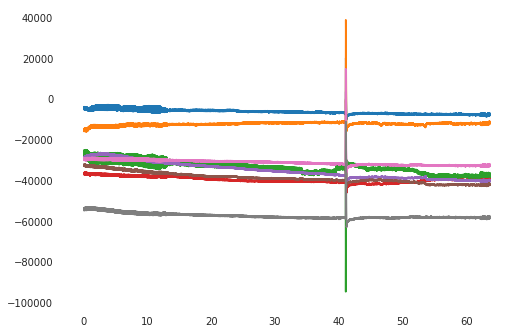

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_03-28-21.csv-------------


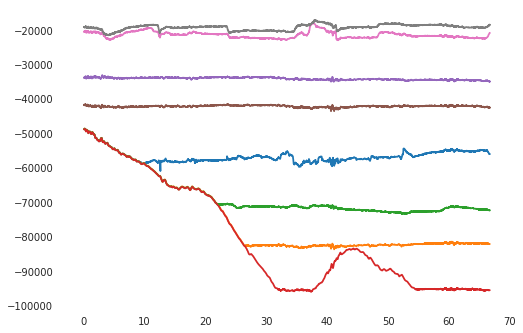

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-25-36.csv-------------


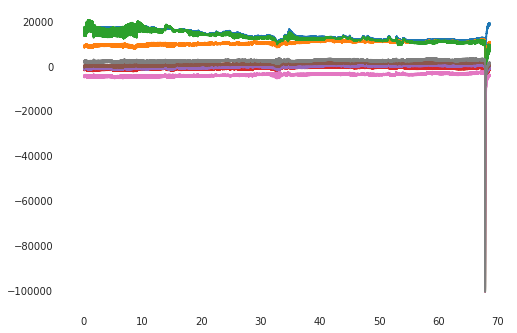

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-38-49.csv-------------


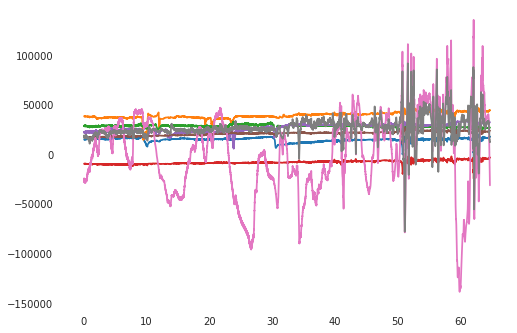

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_04-55-39.csv-------------


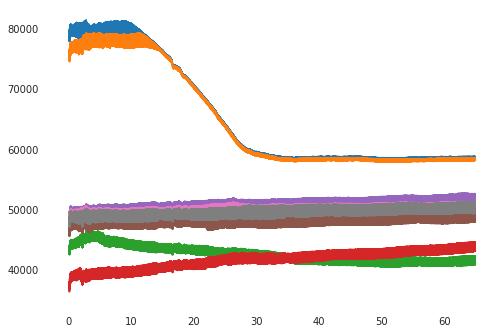

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_04-37-15.csv-------------


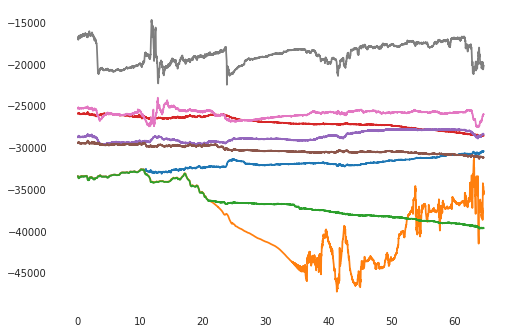

In [11]:
for rst, test_rest in zip(rst_list,rsts): 
    print("-------------"+rst+"-------------")
    fig, ax = plt.subplots()
    plt.plot(test_rest["Time"][10:-10],test_rest.iloc[10:-10,1:-1])
    plt.show()


-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-10-05_15-07-34 rest.csv-------------


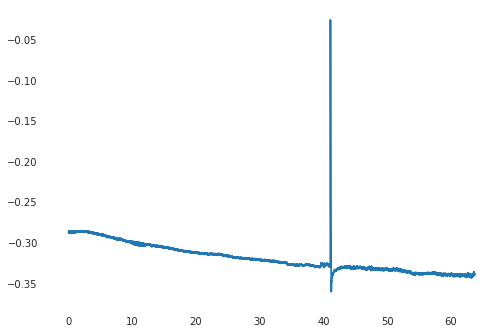

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_03-28-21.csv-------------


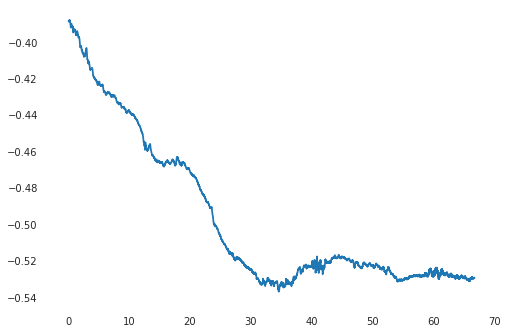

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-25-36.csv-------------


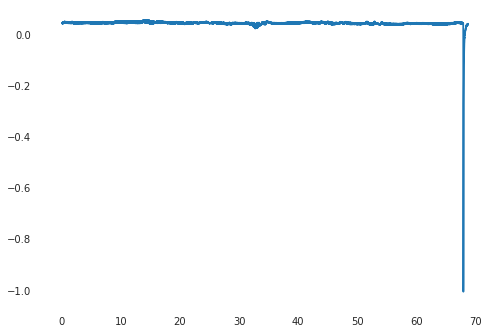

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-38-49.csv-------------


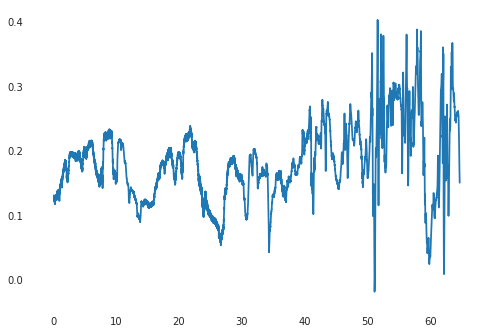

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_04-55-39.csv-------------


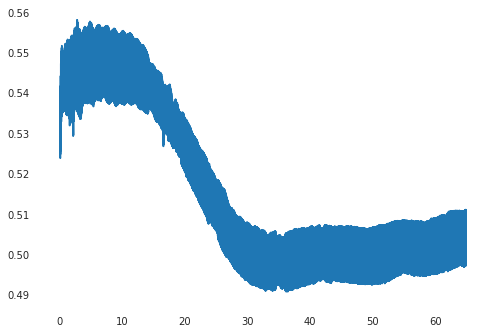

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_04-37-15.csv-------------


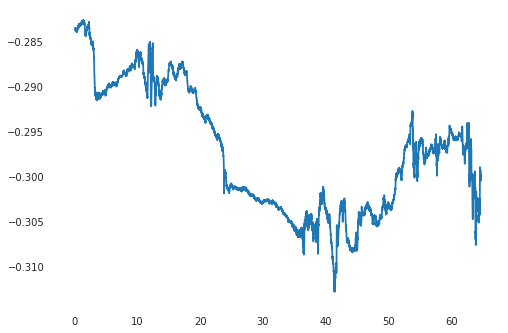

In [12]:
for rst, test_rest in zip(rst_list,rsts): 
    print("-------------"+rst+"-------------")    
    fig, ax = plt.subplots()
    ax.plot(test_rest["Time"][10:-10], test_rest.iloc[10:-10,1:-1].mean(axis=1)/100000)
    plt.show()


-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-10-05_15-07-34 rest.csv-------------


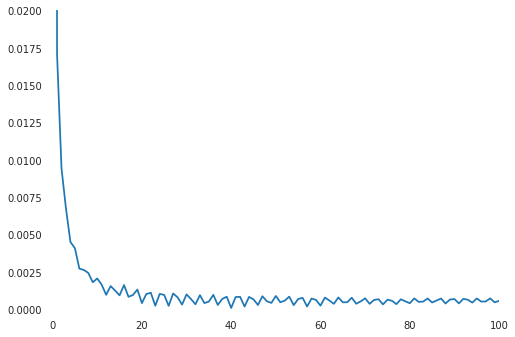

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_03-28-21.csv-------------


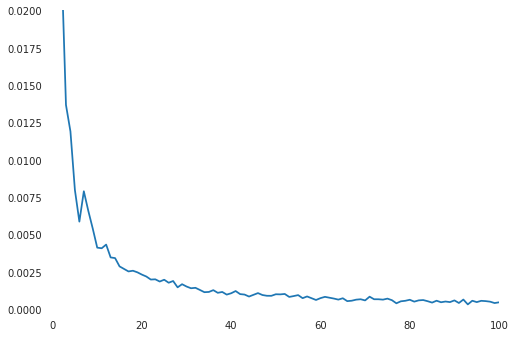

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-25-36.csv-------------


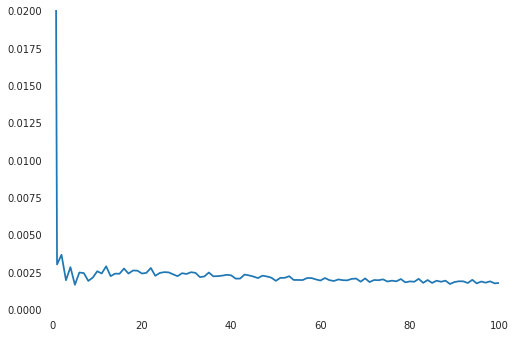

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_05-38-49.csv-------------


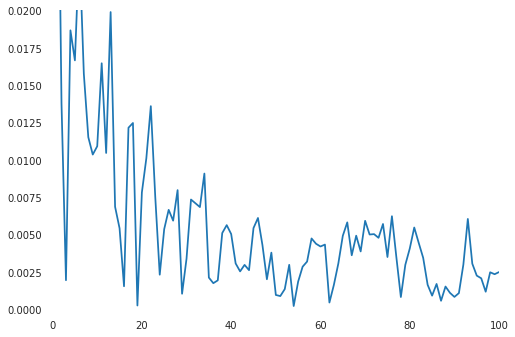

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-25_04-55-39.csv-------------


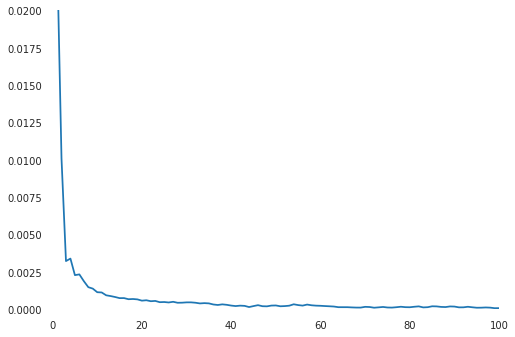

-------------OpenBCI_Converted/rest/converted_OpenBCI-RAW-2019-09-26_04-37-15.csv-------------


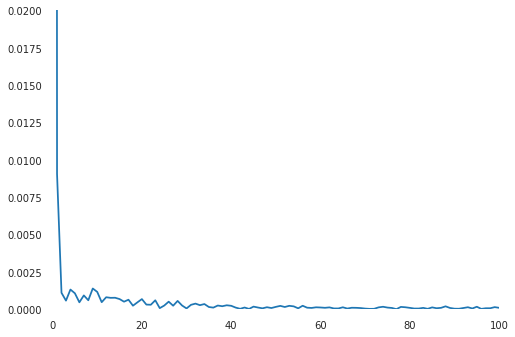

In [16]:
from scipy import fftpack
rest_dataset = []

for rst, test_rest in zip(rst_list,rsts): 
    N = len(test_rest)

    # sample spacing
    T = 1.0 / N
    x = np.linspace(0.0, N*T, N)
    y = test_rest.iloc[10:-10,1:-1].mean(axis=1)/100000
    yf = scipy.fftpack.fft(y)
    xf = np.linspace(0.0, 1.0/(2.0*T), N/2)
    print("-------------"+rst+"-------------")

    fig, ax = plt.subplots()
    ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
    rest_dataset.append(2.0/N * np.abs(yf[:N//2]))
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 0.02)
    plt.show()

In [17]:
names=["freq1","freq2","freq3","freq4","freq5","freq6"]
rest_df = pd.DataFrame(rest_dataset, index=names)
rest_df = rest_df.loc[:,:50]
rest_df["label"] = 0
rest_df

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,label
freq1,0.637898,0.017095,0.009428,0.006741,0.004503,0.004090,0.002718,0.002633,0.002431,0.001811,...,0.000833,0.000185,0.000829,0.000664,0.000287,0.000874,0.000536,0.000428,0.000892,0
freq2,0.991031,0.045851,0.023250,0.013672,0.011900,0.007983,0.005865,0.007897,0.006587,0.005397,...,0.001016,0.000986,0.000853,0.000969,0.001084,0.000955,0.000905,0.000902,0.001007,0
freq3,0.082100,0.003000,0.003647,0.001944,0.002819,0.001643,0.002461,0.002422,0.001899,0.002120,...,0.002057,0.002325,0.002268,0.002190,0.002087,0.002248,0.002198,0.002115,0.001904,0
freq4,0.363100,0.038261,0.013768,0.001947,0.018662,0.016651,0.024277,0.015758,0.011515,0.010352,...,0.002537,0.002972,0.002617,0.005435,0.006110,0.004298,0.002009,0.003791,0.000959,0
freq5,1.028223,0.024082,0.010084,0.003226,0.003393,0.002285,0.002335,0.001883,0.001481,0.001384,...,0.000245,0.000230,0.000151,0.000215,0.000276,0.000206,0.000199,0.000249,0.000257,0
freq6,0.593304,0.009058,0.001102,0.000580,0.001322,0.001070,0.000468,0.000929,0.000605,0.001392,...,0.000033,0.000119,0.000026,0.000180,0.000119,0.000065,0.000139,0.000086,0.000163,0


In [48]:
delta = rest_df.iloc[:, 0:4].mean(axis=1)
theta = rest_df.iloc[:, 5:8].mean(axis=1)
alpha = rest_df.iloc[:, 9:12].mean(axis=1)
beta = rest_df.iloc[:, 15:30].mean(axis=1)
gamma = rest_df.iloc[:, 31:50].mean(axis=1)

print ("Alpha Mean (in volt) : ")
print(alpha)
print ("Beta Mean (in volt) : ")
print(beta)
print ("Gamma Mean (in volt) : ")
print(gamma)
print ("Delta Mean (in volt) : ")
print(delta)
print ("Theta Mean (in volt) : ")
print(theta)


Alpha Mean (in volt) : 
freq1    0.001840
freq2    0.004535
freq3    0.002354
freq4    0.012572
freq5    0.001218
freq6    0.001010
dtype: float64
Beta Mean (in volt) : 
freq1    0.000856
freq2    0.002155
freq3    0.002458
freq4    0.006674
freq5    0.000574
freq6    0.000423
dtype: float64
Gamma Mean (in volt) : 
freq1    0.000592
freq2    0.001102
freq3    0.002238
freq4    0.004461
freq5    0.000294
freq6    0.000180
dtype: float64
Delta Mean (in volt) : 
freq1    0.167791
freq2    0.268451
freq3    0.022673
freq4    0.104269
freq5    0.266404
freq6    0.151011
dtype: float64
Theta Mean (in volt) : 
freq1    0.003147
freq2    0.007248
freq3    0.002176
freq4    0.018896
freq5    0.002168
freq6    0.000822
dtype: float64


# Step Data 
--------
### Data Loading
The data is first transformed into suitable format using a converter code, <br/>to be in csv format and remove redunant columns

### Data Visualization

We Visualize the time series in time domain. to make a visual check that we are loading the correct data,
<br/> and we can use it to the next steps

### Data Statistical Reporting 

Here we generate a full report for each sample, 
<br/>to see the correlation between signals and also the see the Statistical features of the data itself


### Transformation of the dataset to frequency domain and generation of power specturm

We do this, because EEG is only useful in frequency, and it's not having useful features in time domain alone,
also to apply a HPF to choose the relevant features

### Building the final dataset for classifcation 

We combine the data from all the samples, and add relevant features, to build a small dataset for the model itself

In [50]:
import glob

stp_list = [f for f in glob.glob("OpenBCI_Converted/step/*.csv")]
stp_list

['OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-43-07.csv',
 'OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-10-05_15-10-57 harvard step test.csv',
 'OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_03-30-42.csv',
 'OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_04-39-28.csv',
 'OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-27-19.csv',
 'OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_04-59-08.csv']

In [51]:
stps = []
for stp in stp_list :
    test_step = pd.read_csv(stp)
    test_step = test_step.replace(np.nan, 0)
    stps.append(test_step)
    print("-------------"+stp+"-------------")
    print(test_step.head(5))


-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-43-07.csv-------------
    Time     chan1     chan2     chan3    chan4     chan5     chan6     chan7  \
0  0.008      0.00      0.00      0.00     0.00      0.00      0.00      0.00   
1  0.016  16377.21  43389.43  25589.75 -4602.58  32221.65  22642.32 -17135.23   
2  0.024  10745.24  22399.96   9329.46 -3788.91  18585.23  12631.06  17047.18   
3  0.032  21607.05  44914.98  18755.75 -7473.69  37247.08  25352.40  34817.02   
4  0.040  21718.14  45030.20  18814.78 -7364.05  37162.01  25408.84  34902.63   

      chan8  Sample_rate  
0      0.00        125.0  
1  29833.43        125.0  
2  17833.41        125.0  
3  36031.86        125.0  
4  35750.38        125.0  
-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-10-05_15-10-57 harvard step test.csv-------------
    Time     chan1     chan2     chan3     chan4     chan5     chan6  \
0  0.008      0.00      0.00      0.00      0.00      0.00      0.00   

In [52]:
for stp, test_step in zip(stp_list,stps): 
    print("-------------"+stp+"-------------")
    print(test_step.describe())

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-43-07.csv-------------
               Time         chan1         chan2         chan3         chan4  \
count  37836.000000  37836.000000  37836.000000  37836.000000  37836.000000   
mean     151.348000  27302.587966  34193.305009  10373.707043 -13082.254583   
std       87.379654   3614.657913  14627.068495   7320.738787   3538.460494   
min        0.008000  -3653.190000      0.000000 -24024.060000 -43439.590000   
25%       75.678000  24873.605000  19452.610000   9773.180000 -15869.955000   
50%      151.348000  27014.575000  41052.275000  12808.765000 -13320.295000   
75%      227.018000  30248.712500  45808.405000  14491.590000 -10533.447500   
max      302.688000  47419.890000  66876.710000  29346.010000   9476.160000   

              chan5         chan6          chan7          chan8  Sample_rate  
count  37836.000000  37836.000000   37836.000000   37836.000000      37836.0  
mean   30891.469689  24208.617912  

In [60]:
frontall = []

for stp, test_step in zip(stp_list,stps): 
    frontal = test_step.mean()
    frontall.append(frontal)

frontal_final = pd.concat(frontall, axis=1, keys=[s.name for s in frontall])
frontal_final['mean'] = frontal_final.mean(axis=1)
frontal_final["mean"]
frontal_final["mean"]["chan4"]

frontal = mean([frontal_final["mean"]["chan2"] ,frontal_final["mean"]["chan1"]])
central = mean([frontal_final["mean"]["chan4"], frontal_final["mean"]["chan3"]])
parietal = mean([frontal_final["mean"]["chan6"],frontal_final["mean"]["chan5"],
frontal_final["mean"]["chan7"],frontal_final["mean"]["chan8"]])

print(frontal)
print(central)
print(parietal)

-7247.752185003121
-18866.61858781118
-16319.869849210465


In [32]:
for stp, test_step in zip(stp_list,stps): 
    print("-------------"+stp+"-------------")
    test_step.profile_report().to_file("statistcs reports"+"/step/"+stp.split(".")[0]+".html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 105.55it/s]


-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-43-07.csv-------------


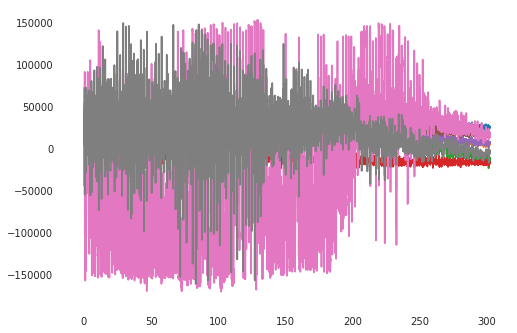

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-10-05_15-10-57 harvard step test.csv-------------


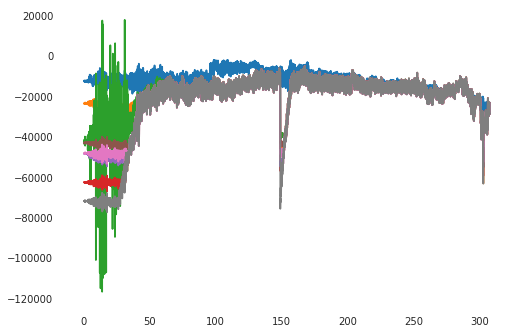

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_03-30-42.csv-------------


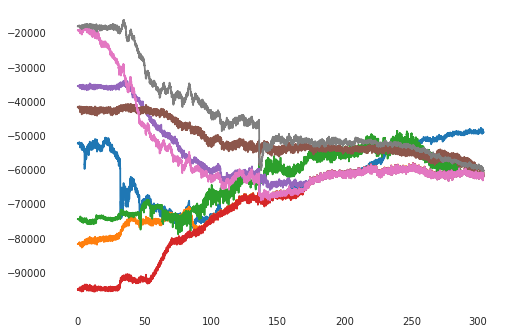

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_04-39-28.csv-------------


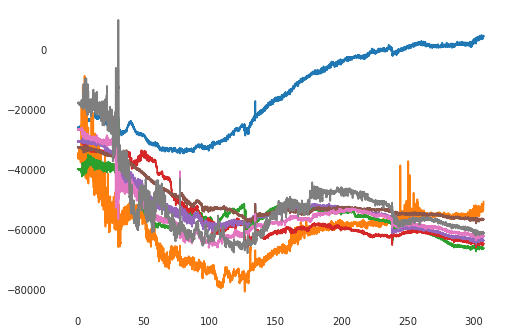

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-27-19.csv-------------


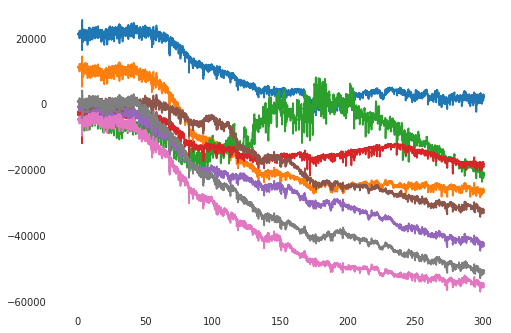

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_04-59-08.csv-------------


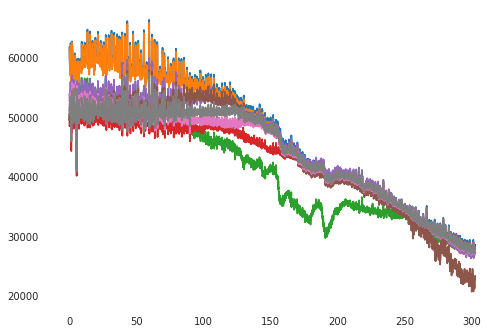

In [53]:
for stp, test_step in zip(stp_list,stps): 
    print("-------------"+stp+"-------------")
    fig, ax = plt.subplots()
    plt.plot(test_step["Time"][10:-10],test_step.iloc[10:-10,1:-1])
    plt.show()


-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-43-07.csv-------------


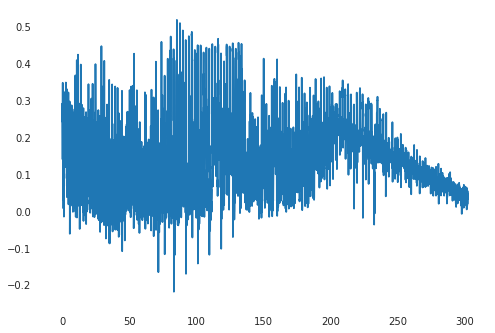

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-10-05_15-10-57 harvard step test.csv-------------


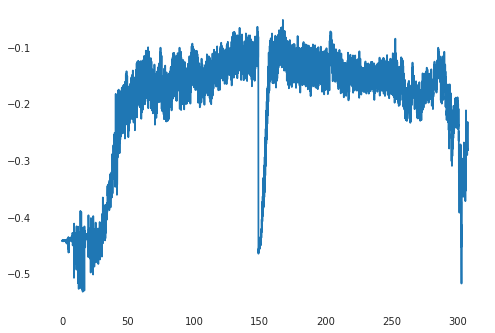

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_03-30-42.csv-------------


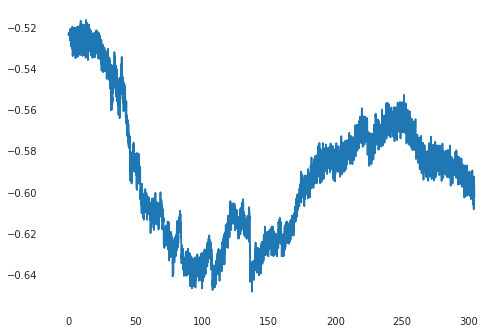

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_04-39-28.csv-------------


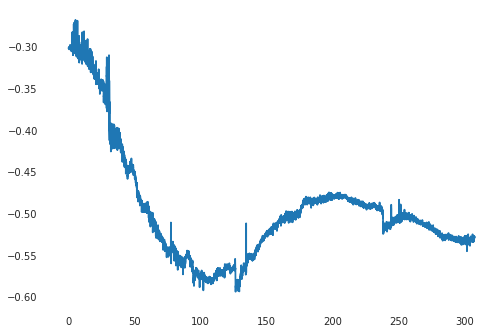

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-27-19.csv-------------


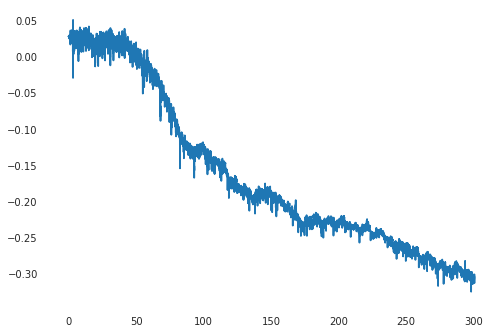

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_04-59-08.csv-------------


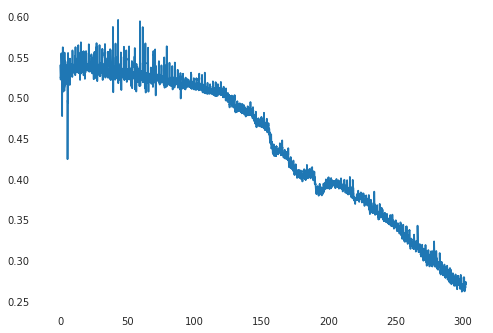

In [20]:

for stp, test_step in zip(stp_list,stps): 
    print("-------------"+stp+"-------------")
    fig, ax = plt.subplots()
    plt.plot(test_step["Time"][10:-10], test_step.iloc[10:-10,1:-1].mean(axis=1)/100000)
    plt.show()


-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-43-07.csv-------------


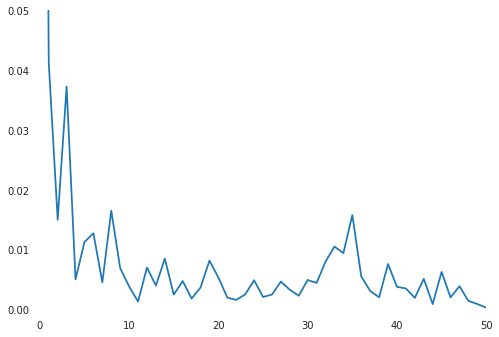

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-10-05_15-10-57 harvard step test.csv-------------


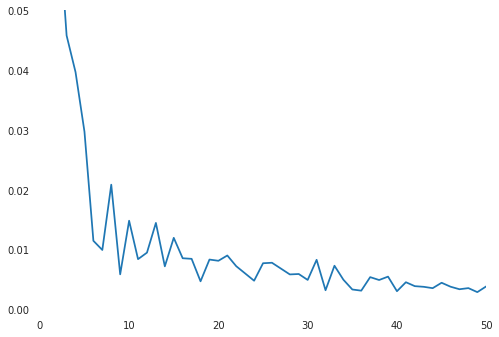

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_03-30-42.csv-------------


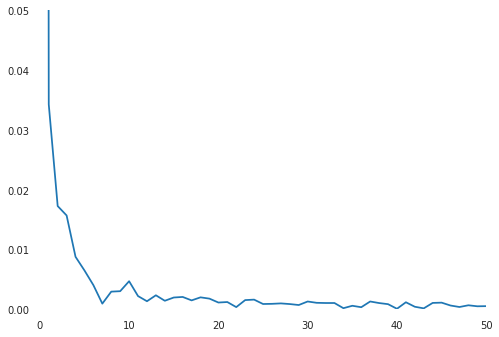

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-26_04-39-28.csv-------------


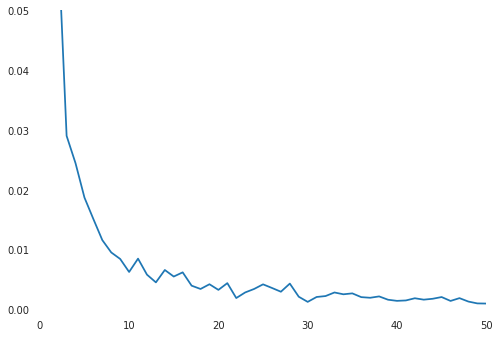

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_05-27-19.csv-------------


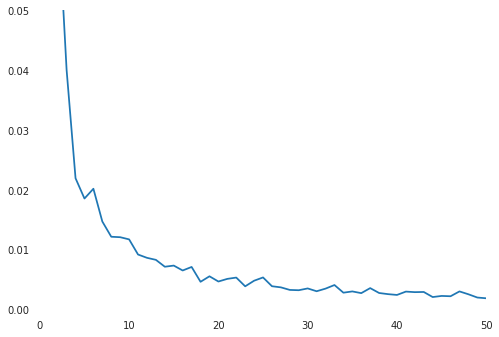

-------------OpenBCI_Converted/step/converted_OpenBCI-RAW-2019-09-25_04-59-08.csv-------------


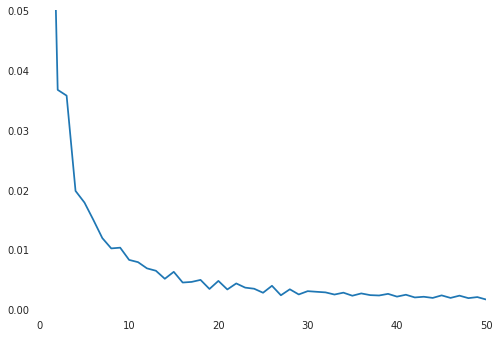

In [54]:
from scipy import fftpack
step_dataset = []

for stp, test_step in zip(stp_list,stps): 
    N = len(test_step)

    # sample spacing
    T = 1.0 / N
    x = np.linspace(0.0, N*T, N)
    y = test_step.iloc[10:-10,1:-1].mean(axis=1)/100000
    yf = scipy.fftpack.fft(y)
    xf = np.linspace(0.0, 1.0/(2.0*T), N/2)
    print("-------------"+stp+"-------------")

    fig, ax = plt.subplots()
    ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
    step_dataset.append(2.0/N * np.abs(yf[:N//2]))
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 0.05)
    plt.show()

In [58]:
names=["freq11","freq22","freq33","freq44","freq55","freq66"]
step_df = pd.DataFrame(step_dataset, index=names)
step_df = step_df.loc[:,:50]
step_df["label"] = 1
step_df

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,label
freq11,0.251820,0.041236,0.014969,0.037256,0.005006,0.011251,0.012717,0.004493,0.016489,0.006883,...,0.001907,0.005096,0.000878,0.006250,0.001994,0.003858,0.001408,0.000879,0.000278,1
freq22,0.397686,0.091626,0.067136,0.045782,0.039663,0.029705,0.011455,0.009922,0.020842,0.005847,...,0.003870,0.003761,0.003535,0.004440,0.003780,0.003355,0.003544,0.002871,0.003834,1
freq33,1.180720,0.034273,0.017265,0.015694,0.008775,0.006497,0.004040,0.000947,0.002954,0.003027,...,0.000426,0.000159,0.001068,0.001113,0.000632,0.000385,0.000673,0.000504,0.000527,1
freq44,0.990030,0.050525,0.063509,0.029004,0.024426,0.018681,0.015085,0.011568,0.009505,0.008419,...,0.001849,0.001613,0.001762,0.002050,0.001399,0.001868,0.001294,0.000986,0.000960,1
freq55,0.324433,0.118078,0.067609,0.040021,0.021917,0.018524,0.020161,0.014681,0.012133,0.012058,...,0.002869,0.002898,0.002049,0.002235,0.002183,0.002991,0.002513,0.001969,0.001841,1
freq66,0.879337,0.102500,0.036701,0.035733,0.019796,0.017850,0.014941,0.011908,0.010183,0.010306,...,0.001982,0.002098,0.001903,0.002328,0.001904,0.002283,0.001866,0.002044,0.001628,1


In [59]:
delta = step_df.iloc[:, 0:4].mean(axis=1)
theta = step_df.iloc[:, 5:8].mean(axis=1)
alpha = step_df.iloc[:, 9:12].mean(axis=1)
beta = step_df.iloc[:, 15:30].mean(axis=1)
gamma = step_df.iloc[:, 31:50].mean(axis=1)

print ("Alpha Mean (in volt) : ")
print(alpha)
print ("Beta Mean (in volt) : ")
print(beta)
print ("Gamma Mean (in volt) : ")
print(gamma)
print ("Delta Mean (in volt) : ")
print(delta)
print ("Theta Mean (in volt) : ")
print(theta)

Alpha Mean (in volt) : 
freq11    0.003998
freq22    0.009682
freq33    0.003312
freq44    0.007711
freq55    0.010971
freq66    0.008817
dtype: float64
Beta Mean (in volt) : 
freq11    0.003443
freq22    0.007404
freq33    0.001304
freq44    0.003734
freq55    0.004931
freq66    0.003865
dtype: float64
Gamma Mean (in volt) : 
freq11    0.005037
freq22    0.004347
freq33    0.000724
freq44    0.001879
freq55    0.002783
freq66    0.002324
dtype: float64
Delta Mean (in volt) : 
freq11    0.086320
freq22    0.150558
freq33    0.311988
freq44    0.283267
freq55    0.137535
freq66    0.263568
dtype: float64
Theta Mean (in volt) : 
freq11    0.009487
freq22    0.017027
freq33    0.003828
freq44    0.015112
freq55    0.017789
freq66    0.014899
dtype: float64


# Model and Signal Classification 

In this section, we just apply the the following algorithms on the data.
<br/> in order to classify the signal whether it belongs to rest or activity

### Common setup 
- test_size = 0.5

### SVM 
- C=10E3
- kernel = linear

#### confusion_matrix

|          | positive | negative |
|----------|----------|----------|
| positive | 4        | 0        |
| negative | 0        | 2        |

#### classification_report

|              | precision | recall | f1-score | support |
|--------------|-----------|--------|----------|---------|
| 0            | 1.00      | 1.00   | 1.00     | 4       |
| 1            | 1.00      | 1.00   | 1.00     | 2       |
| accuracy     | 1.00      | 6      |          |         |
| macro avg    | 1.00      | 1.00   | 1.00     | 6       |
| weighted avg | 1.00      | 1.00   | 1.00     | 6       | 

#### accuracy_score
1.0


### Random Forests 
- random_state = 0
- iterations = 100



#### confusion_matrix
|          | positive | negative |
|----------|----------|----------|
| positive | 3        | 1        |
| negative | 0        | 2        |


#### classification_report
|              | precision | recall | f1-score | support |
|--------------|-----------|--------|----------|---------|
| 0            | 1.00      | 0.75   | 0.86     | 4       |
| 1            | 0.67      | 1.00   | 0.80     | 2       |
| accuracy     | 0.83      | 6      |          |         |
| macro avg    | 0.83      | 0.88   | 0.83     | 6       |
| weighted avg | 0.89      | 0.83   | 0.84     | 6       |


#### accuracy_score

0.8333333333333334


In [49]:
final_df = pd.concat([rest_df, step_df])
final_df

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,label
freq1,0.637898,0.017095,0.009428,0.006741,0.004503,0.004090,0.002718,0.002633,0.002431,0.001811,...,0.000968,0.001553,0.001256,0.000933,0.001622,0.000835,0.000957,0.001320,0.000413,0
freq2,0.991031,0.045851,0.023250,0.013672,0.011900,0.007983,0.005865,0.007897,0.006587,0.005397,...,0.004329,0.003471,0.003425,0.002870,0.002701,0.002533,0.002580,0.002474,0.002321,0
freq3,0.082100,0.003000,0.003647,0.001944,0.002819,0.001643,0.002461,0.002422,0.001899,0.002120,...,0.002876,0.002218,0.002385,0.002379,0.002727,0.002389,0.002595,0.002586,0.002393,0
freq4,0.363100,0.038261,0.013768,0.001947,0.018662,0.016651,0.024277,0.015758,0.011515,0.010352,...,0.010458,0.019883,0.006856,0.005423,0.001542,0.012147,0.012464,0.000255,0.007818,0
freq5,1.028223,0.024082,0.010084,0.003226,0.003393,0.002285,0.002335,0.001883,0.001481,0.001384,...,0.000937,0.000886,0.000823,0.000748,0.000750,0.000675,0.000689,0.000664,0.000578,0
freq6,0.593304,0.009058,0.001102,0.000580,0.001322,0.001070,0.000468,0.000929,0.000605,0.001392,...,0.000807,0.000766,0.000773,0.000685,0.000510,0.000641,0.000241,0.000466,0.000683,0
freq11,0.251820,0.041236,0.014969,0.037256,0.005006,0.011251,0.012717,0.004493,0.016489,0.006883,...,0.006985,0.003967,0.008482,0.002452,0.004733,0.001789,0.003645,0.008143,0.005316,1
freq22,0.397686,0.091626,0.067136,0.045782,0.039663,0.029705,0.011455,0.009922,0.020842,0.005847,...,0.009478,0.014447,0.007186,0.011953,0.008539,0.008440,0.004681,0.008319,0.008114,1
freq33,1.180720,0.034273,0.017265,0.015694,0.008775,0.006497,0.004040,0.000947,0.002954,0.003027,...,0.001348,0.002345,0.001427,0.001971,0.002066,0.001491,0.002001,0.001783,0.001132,1
freq44,0.990030,0.050525,0.063509,0.029004,0.024426,0.018681,0.015085,0.011568,0.009505,0.008419,...,0.005794,0.004503,0.006573,0.005479,0.006180,0.003951,0.003400,0.004191,0.003247,1


In [38]:
final_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,label
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,0.643307,0.047965,0.027372,0.019300,0.013515,0.011353,0.009710,0.007087,0.008052,0.005750,...,0.004953,0.005730,0.004284,0.004039,0.003528,0.003879,0.003564,0.003260,0.003451,0.500000
std,0.362452,0.037164,0.025091,0.017138,0.011613,0.008955,0.007851,0.005526,0.006511,0.003866,...,0.003561,0.005896,0.002901,0.003370,0.002543,0.003619,0.003217,0.002797,0.002703,0.522233
min,0.082100,0.003000,0.001102,0.000580,0.001322,0.001070,0.000468,0.000929,0.000605,0.001384,...,0.000807,0.000766,0.000773,0.000685,0.000510,0.000641,0.000241,0.000255,0.000413,0.000000
25%,0.353433,0.022335,0.009920,0.002906,0.004225,0.003639,0.002654,0.002287,0.002298,0.002043,...,0.001253,0.002052,0.001384,0.001712,0.001602,0.001327,0.001740,0.001156,0.001020,0.000000
50%,0.615601,0.039748,0.016117,0.014683,0.010338,0.009617,0.008660,0.006195,0.008046,0.005622,...,0.005062,0.003719,0.004264,0.002661,0.002714,0.002461,0.002997,0.002530,0.002820,0.500000
75%,0.990280,0.060800,0.043403,0.036114,0.020326,0.018018,0.014977,0.011653,0.011669,0.008891,...,0.007391,0.006903,0.006922,0.005676,0.005095,0.005206,0.004621,0.004523,0.004891,1.000000
max,1.180720,0.118078,0.067609,0.045782,0.039663,0.029705,0.024277,0.015758,0.020842,0.012058,...,0.010458,0.019883,0.008482,0.011953,0.008539,0.012147,0.012464,0.008319,0.008114,1.000000


In [39]:
final_df.profile_report().to_file("statistcs reports"+"/final_report/"+"final.html")


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 69.64it/s]


In [51]:
X = final_df.drop('label', axis=1)
y = final_df['label']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.5)


In [54]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score


svclassifier = SVC(kernel='linear', C=10E3)
svclassifier.fit(X_train, y_train)

y_pred = svclassifier.predict(X_test)
print("-------confusion_matrix----------")
print(confusion_matrix(y_test,y_pred))
print("-------classification_report----------")
print(classification_report(y_test,y_pred))
print("-------accuracy_score----------")
print(accuracy_score(y_test, y_pred))


-------confusion_matrix----------
[[4 0]
 [0 2]]
-------classification_report----------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         2

    accuracy                           1.00         6
   macro avg       1.00      1.00      1.00         6
weighted avg       1.00      1.00      1.00         6

-------accuracy_score----------
1.0


In [55]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

regressor = RandomForestRegressor(n_estimators=100, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

y_pred = [ 0 if y <= 0.5 else 1 for y in y_pred]
print("-------confusion_matrix----------")
print(confusion_matrix(y_test,y_pred))
print("-------classification_report----------")
print(classification_report(y_test,y_pred))
print("-------accuracy_score----------")
print(accuracy_score(y_test, y_pred))


-------confusion_matrix----------
[[3 1]
 [0 2]]
-------classification_report----------
              precision    recall  f1-score   support

           0       1.00      0.75      0.86         4
           1       0.67      1.00      0.80         2

    accuracy                           0.83         6
   macro avg       0.83      0.88      0.83         6
weighted avg       0.89      0.83      0.84         6

-------accuracy_score----------
0.8333333333333334
